# Проверка данных на нормальность



<a id="Libraries"></a>
##  Загрузка библиотек 

In [ ]:
from scipy.stats import ttest_1samp
import numpy as np
import pandas as pd


from scipy.stats import norm, t, kstest, shapiro
import statsmodels.api as sm
from matplotlib import pyplot as plt


import warnings
warnings.filterwarnings('ignore')
warnings.warn('DelftStack')
warnings.warn('Do not show this message')



In [ ]:
np.random.seed(17)

In [ ]:
# помимо нормального распределения создадим выборку распределения Стьюдента
# с пятью степенями свободы. Напомним, что по форме они очень сильно похожи
x = norm.rvs(size = 250)
y = t.rvs(size = 250, df = 5)

In [ ]:
import plotly.express as px
fig = px.histogram(y, x=y, title='y',marginal = 'box')
fig.show(renderer="colab")

In [ ]:
import plotly.express as px
fig = px.histogram(x, x=x, title='x',marginal = 'box')
fig.show(renderer="colab")

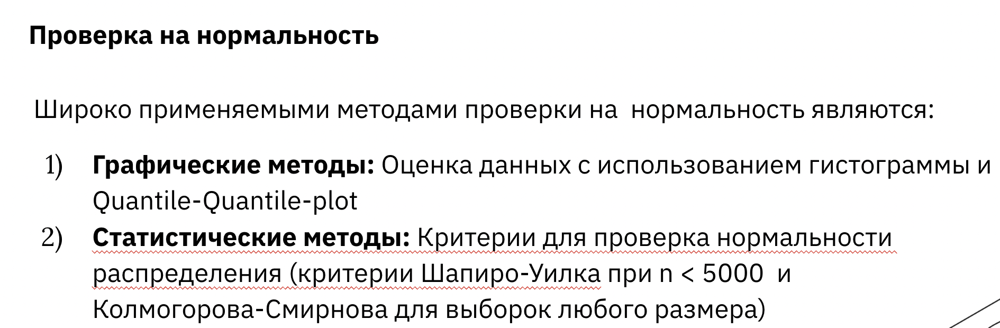

Можно визуально проверить работу тестов с помощью функции qqplot. Она построит график квантилей распределения по оси теоретического нормального распределения. Получиться должна прямая, идущая из левого нижнего угла в верхний правый



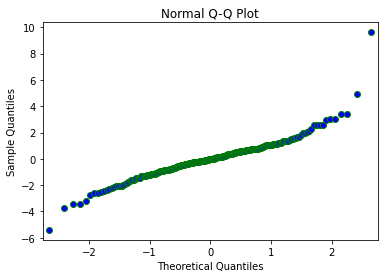

In [ ]:
fig = sm.qqplot(y, color="green")
plt.title("Normal Q-Q Plot")
plt.show()

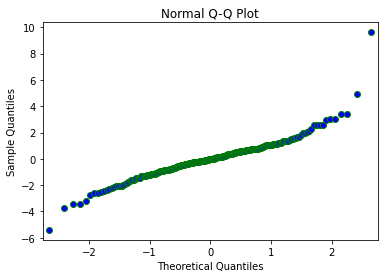

In [ ]:
fig = sm.qqplot(y, color="green")
plt.title("Normal Q-Q Plot")
plt.show()

## Тест Колмогорова-Смирнова может использоваться на выборки любого размера
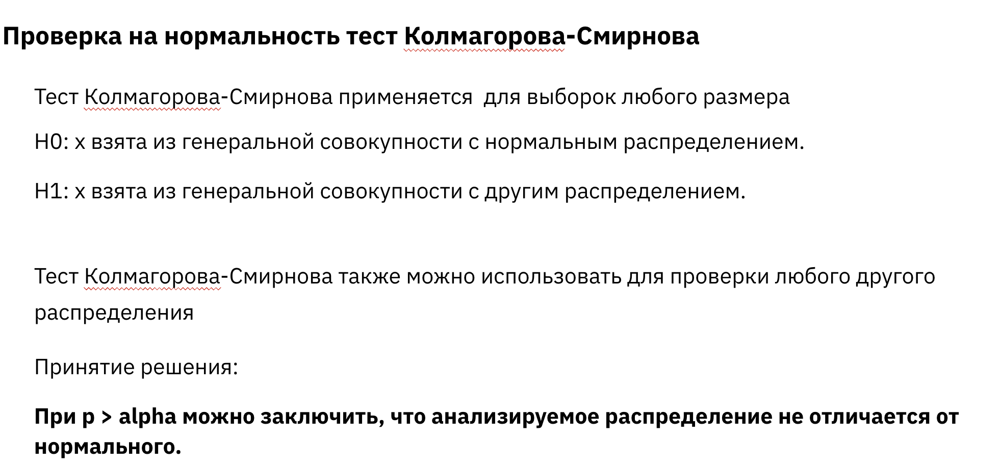

Его можно использовать для проверки любого распределения, в том числе и Стьюдента, Биномиального, Коши, Экспоненциального

In [ ]:
# Проверим принадлежность выборок к нормальному распределению
print(kstest(x, "norm"))
print(kstest(y, "norm"))


KstestResult(statistic=0.057424163162479946, pvalue=0.3678988921991774)
KstestResult(statistic=0.054751982840907654, pvalue=0.4266179885446888)


In [ ]:
# Семейство Экспоненциальных (сложная гипотеза)
print(kstest(x, "expon"))

# Биномиальное, обратим внимание, что оно требует уточнения параметров (простая гипотеза)
print(kstest(x, "binom", args=(1500, 0.16)))

KstestResult(statistic=0.448, pvalue=2.739849972719059e-46)
KstestResult(statistic=1.0, pvalue=0.0)


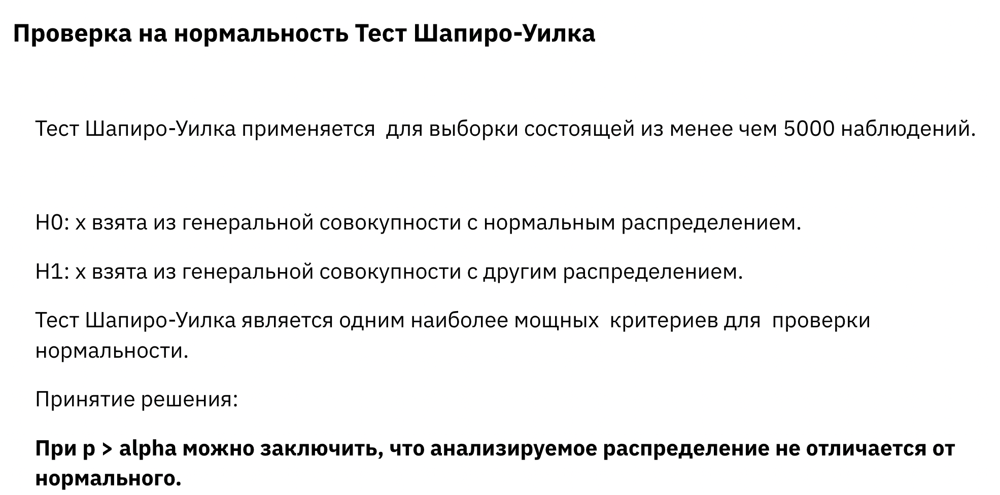

In [ ]:
W, p_val = shapiro(x)
print("Shapiro-Wilk normality test for X")
print("W =", W)
print("P-value =", p_val)

Shapiro-Wilk normality test for X
W = 0.9963920712471008
P-value = 0.8381169438362122


In [ ]:
W, p_val = shapiro(y)
print("Shapiro-Wilk normality test for X")
print("W =", W)
print("P-value =", p_val)

Shapiro-Wilk normality test for X
W = 0.9189562797546387
P-value = 2.0092326413756467e-10


Можно обратить внимание, что тест Шапиро-Уилка отвергает нулевую гипотезу выборки y при том что тест Колмогорова-Смирнова говорит обратное с p-value = 0.43

<a id="H0"></a>

##Анализ мощности теста/расчет длительности эксперимента

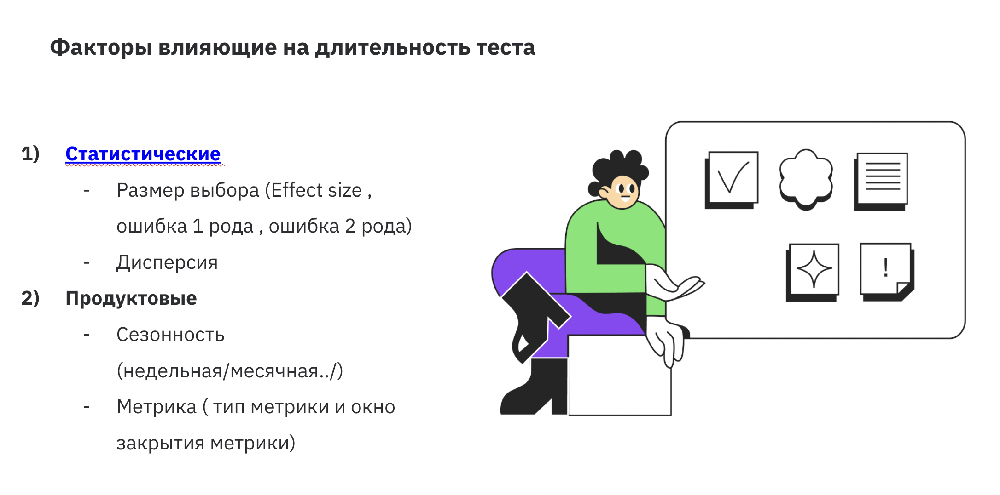

In [ ]:
import math
import numpy as np
import statsmodels.stats.power as smp
from tqdm.auto import tqdm
import matplotlib.pyplot as plt
import seaborn as sns

plt.style.use('ggplot')

In [ ]:
# Критерий пропорций (нужен для кликов, конверсий)
alpha = 0.05
power = 0.9
n = 450
p_x = 0.5
p_y = 0.6

h = 2*math.asin(np.sqrt(p_x)) - 2*math.asin(np.sqrt(p_y))

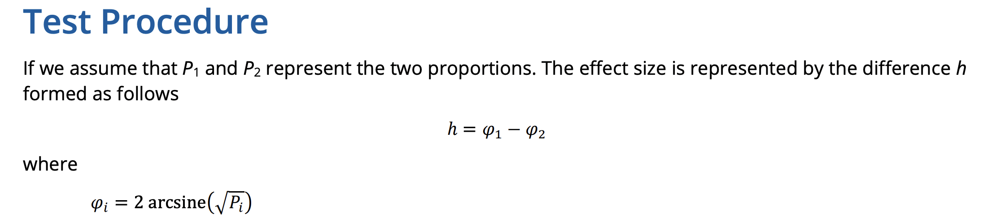

In [ ]:
# Какой будет мощность критерия  для выборки из n наблюдений,  при том  что величина эффекта = h c и alpha = 5%

power = smp.zt_ind_solve_power(effect_size=h, nobs1=n, alpha=alpha, alternative='two-sided')
power

0.8555200838742346

In [ ]:
# Какое кол-во наблюдений  необходимо для заданного эффекта при с alpha = 5% и power = 80%

smp.zt_ind_solve_power(effect_size = h, alpha = alpha, power = power, alternative='two-sided')

449.9999999951084

In [ ]:
# Какой будет величина эффекта будет при рассчете теста, при указанных alpha и power
smp.zt_ind_solve_power(nobs1 = n, alpha = alpha, power = power)

0.20135582707747696

In [ ]:
effects = []
sample_sizes = []

for i in tqdm(range(10,10000)):
    effects.append(smp.tt_ind_solve_power(nobs1 = i, alpha = alpha, power = power))
    sample_sizes.append(i)

  0%|          | 0/9990 [00:00<?, ?it/s]

In [ ]:
df = pd.DataFrame({'effects':effects, 'sample_sizes':sample_sizes})

In [ ]:
df

,effects,sample_sizes
0,1.428738,10
1,1.354278,11
2,1.290467,12
3,1.234970,13
4,1.186115,14
...,...,...
9985,0.042727,9995
9986,0.042725,9996
9987,0.042723,9997
9988,0.042721,9998


In [ ]:
import plotly.express as px

fig = px.line(df, x='sample_sizes', y='effects', title='effect vs sample size')
fig.show(renderer="colab")

In [ ]:
power = []
sample_sizes = []

for i in tqdm(range(10,10000)):
    power.append(smp.tt_ind_solve_power(nobs1 = i, alpha = alpha, effect_size = 0.1))
    sample_sizes.append(i)

  0%|          | 0/9990 [00:00<?, ?it/s]

In [ ]:
df_2 = pd.DataFrame({'power': power, 'sample_sizes':sample_sizes})

In [ ]:
import plotly.express as px

fig = px.line(df_2, x='sample_sizes', y='power', title='power vs sample size')
fig.show(renderer="colab")

#Множественная проверк гипотез


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from scipy import stats

rvs1 = stats.norm.rvs(loc=5, scale=10, size=1000, random_state=0)
rvs2 = stats.norm.rvs(loc=6.5, scale=8, size=1000, random_state=0)

In [ ]:
def t_test_function(rvs, alpha, no_test):
    counter = 0
    for i in range(no_test):
        rvs_random = stats.norm.rvs(loc=5, scale=10, size=1000, random_state=i+1)

        statistic, pvalue = stats.ttest_ind(rvs, rvs_random, equal_var=False)

        if pvalue <= alpha:
            counter = counter + 1

    print(counter)

In [ ]:
#https://towardsdatascience.com/an-overview-of-the-multiple-comparison-problem-166aa5fcaac5
def bonferroni_correction_function(rvs, alpha, no_test):
    alpha_bonferroni = alpha/no_test
    
    counter = 0
    for i in range(no_test):
        rvs_random = stats.norm.rvs(loc=5, scale=10, size=1000, random_state=i+1)

        statistic, pvalue = stats.ttest_ind(rvs, rvs_random, equal_var=False)

        if pvalue <= alpha_bonferroni:
            counter = counter + 1

    print(counter)


In [ ]:
t_test_function(rvs1, alpha=0.05, no_test=100)
t_test_function(rvs2, alpha=0.05, no_test=100)

bonferroni_correction_function(rvs1, alpha=0.05, no_test=100)

bonferroni_correction_function(rvs2, alpha=0.05, no_test=100)



11
85
0
18


#Бутстрап

In [ ]:
!pip install bootstrapped

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
import numpy as np
import pandas as pd
from scipy.stats import norm
import matplotlib.pyplot as plt

from tqdm.auto import tqdm

import bootstrapped.bootstrap as bs
import bootstrapped.compare_functions as bs_compare
import bootstrapped.stats_functions as bs_stats

#https://github.com/facebookarchive/bootstrapped

plt.style.use('ggplot')

In [ ]:
n = 11000

sample_A = np.random.exponential(scale=1/0.002, size=n)
sample_B = np.random.exponential(scale=1/0.00201, size=n)

df = pd.DataFrame({  "sample_A": sample_A, "sample_B": sample_B})


In [ ]:
s1= df.sample_A.values

s2= df.sample_B.values

b = bs.bootstrap_ab(s1,s2, stat_func=bs_stats.mean,
compare_func=bs_compare.difference,alpha=0.05,num_iterations=10000)
        
print(b.lower_bound, b.upper_bound )

-8.261688276845351 18.135421491494785




# Бакетирование ----
Трансформация распределения случайной величины в нормальное с помощью техники бакетирования

Бакетирование подходит тогда, когда необходимо:
* сохранить информацию о дисперсии и среднем в выборке до трансформации
* привести к нормальному распределению

Сгенерируем данные. В качестве примера используется эксп. распределение

Возьмем кратное количество групп. Допустим 2000 (можно взять и 300, и 600)

In [ ]:
import numpy as np
import scipy.stats as sts
from scipy.stats import norm
import pandas as pd
import matplotlib.pyplot as plt

plt.style.use('ggplot')


In [ ]:
b = 2000
n = 200000

val_A = np.random.exponential(scale=1/0.02, size=n)
val_B = np.random.exponential(scale=1/0.021, size=n)

sample_exp = pd.DataFrame({
    "metric":   np.concatenate([val_A, val_B]),  
    "group":  ["A" for i in range(n)] + ["B" for i in range(n)],
    "bucket":   [i for i in range(b)] * int(n*2/b)
})

In [ ]:
# Агрегация по бакетам и считаем среднее:

backeted_df = sample_exp.groupby(by=["bucket","group"])["metric"].agg(
    mu=np.mean, 
    sd_mu=np.std
).reset_index()

In [ ]:
backeted_df.head()

,bucket,group,mu,sd_mu
0,0,A,51.241289,54.594221
1,0,B,43.616745,47.805677
2,1,A,45.785176,44.587650
3,1,B,50.644827,51.655164
4,2,A,50.174511,46.905053


In [ ]:
# Сравним  выборочное среднее и среднее по баккетам

round(np.mean(sample_exp["metric"]),3) == round(np.mean(backeted_df["mu"]),3)

True

In [ ]:
np.var(sample_exp["metric"]) / len(sample_exp["metric"])

0.005972665262096658

In [ ]:
np.var(backeted_df["mu"]) / len(backeted_df["mu"])

0.006554557925073082

In [ ]:
sample_exp

,metric,group,bucket
0,10.719216,A,0
1,75.664228,A,1
2,23.229106,A,2
3,26.017459,A,3
4,173.789927,A,4
...,...,...,...
399995,78.256261,B,1995
399996,22.567677,B,1996
399997,21.153482,B,1997
399998,62.945495,B,1998


In [ ]:
import plotly.express as px
fig = px.histogram(sample_exp, x=sample_exp.metric, title='x',marginal = 'box')
fig.show(renderer="colab")

In [ ]:
import plotly.express as px
fig = px.histogram(backeted_df, x=backeted_df.mu, title='x',marginal = 'box')
fig.show(renderer="colab")

In [ ]:
s1= sample_exp[sample_exp.group=='A'].metric.values

s2= sample_exp[sample_exp.group=='B'].metric.values

b = bs.bootstrap_ab(s1,s2, stat_func=bs_stats.mean,compare_func=bs_compare.difference,alpha=0.05,num_iterations=500)
        
print(b.lower_bound, b.upper_bound )

2.126867492582723 2.7578128367443178


In [ ]:
s1= backeted_df[backeted_df.group=='A'].mu.values

s2= backeted_df[backeted_df.group=='B'].mu.values

b = bs.bootstrap_ab(s1,s2, stat_func=bs_stats.mean,compare_func=bs_compare.difference,alpha=0.05,num_iterations=500)
        
print(b.lower_bound, b.upper_bound )

2.1664386300109597 2.797444593166368
